In [24]:
import numpy as np
import scipy.stats as stats
import scipy.optimize as opt
import matplotlib.pyplot as plt
import scipy.special as special

from rikabplotlib.plot_utils import newplot


def compute_S_hat(w, B, tol=1e-8):
    """
    Given per-event weights w (array of length N) and background rate B > 0,
    solve for S_hat >= 0 satisfying:
        sum_i [ w_i / (B + S_hat * w_i ) ] = 1.
    If sum_i w_i <= B, then S_hat = 0 is the solution.
    Otherwise, we find the unique root in (0, +inf) via bracketing + Brent’s method.
    """
    total_w = np.sum(w)
    # If total_w <= B, then f(0) = total_w / B <= 1 => S_hat = 0
    if total_w <= B:
        return 0.0

    # Define f(S) = sum_i [ w_i / (B + S * w_i ) ] - 1
    def f(S):
        return np.sum(w / (B + S * w)) - 1.0

    # At S = 0, f(0) = total_w / B - 1 > 0 (because total_w > B)
    # At S -> +∞, each term w_i/(B + S*w_i) -> 0, so f(S) -> -1 < 0
    # Thus there is a unique root in (0, ∞). We bracket it by repeatedly doubling.
    S_lo = 0.0
    S_hi = 1.0
    while f(S_hi) > 0:
        S_hi *= 2.0

    # Now f(S_lo)=f(0)>0, f(S_hi)<0 → use Brent’s method
    S_star = opt.brentq(f, S_lo, S_hi, xtol=tol)
    return S_star


# =============================================================================
# 2) Given a list of weights w_i and background B, compute the test stat q.
#    We use:
#      log L(S) = −(S + B) + sum_{i=1}^N ln( B + S * w_i ).
#    Then:
#      log L(0) = −B + N ln B
#      log L(S_hat) = −(S_hat + B) + sum_{i=1}^N ln(B + S_hat * w_i)
#      q = 2 [ log L(0) − log L(S_hat) ].
# =============================================================================
def compute_q_for_weights(w, B):
    """
    Input:
      - w:  a 1D NumPy array of per-event weights of length N
      - B:  the background yield (float > 0)
    Returns:
      - q:  the discovery test statistic (= 2[ logL(0) − logL(S_hat) ])
    """
    N = len(w)
    # 1) Solve for S_hat
    S_hat = compute_S_hat(w, B)

    # 2) log L(0) = −B + N ln B
    logL0 = -B + N * np.log(B)

    # 3) log L(S_hat) =  −(S_hat + B) + sum_i ln(B + S_hat * w_i)
    logLhat = -(S_hat + B) + np.sum(np.log(B + S_hat * w))

    # 4) test statistic
    q = -2.0 * (logL0 - logLhat)
    return q


# =============================================================================
# 3) Simulation parameters
# =============================================================================
np.random.seed(0)             # for reproducibility
B_list         = [5.0, 50.0, 500.0, 5000.0]
n_experiments  = 10000         # number of pseudo–experiments per B
max_plot_q     = 15.0          # range in q to show on the histogram

# =============================================================================
# 4) PDF / sampling for background and definition of w(x)
#    - Background is Gaussian(mean=-1, sigma=1)
#    - Signal is Gaussian(mean=+1, sigma=1)  (not used under H0, but w(x) ∝ f_s/f_b)
#    => w(x) = f_s(x)/f_b(x) = exp( - (x-1)^2/2 + (x+1)^2/2 ) = exp(2 x)
# =============================================================================
def sample_background(n):
    """Draw n samples from N(mean=-1, sigma=1)."""
    return np.random.randn(n) - 1.0

def weight_exp(x):
    """Weight function w(x) = exp(2 x)."""
    return np.exp(2.0 * x)


def weight_unit(x):
    """Unit weight function w(x) = 1."""
    return np.ones_like(x)

def weights_wrong(x):
    """Incorrect weight function w(x) = exp(2 x) + 1."""
    delta = 0.1
    return np.exp(2.0 * x * (1.0 + delta))

# =============================================================================
# 5) Run the pseudo–experiments under H0 (S=0) for each B:
#    For each experiment:
#      a) Draw N ~ Poisson(B)
#      b) If N>0, sample x_i ~ N(-1,1), compute w_i = exp(2 x_i)
#         Else, the test statistic is q=0 (no events => S_hat=0 => logL(0)=logL(0))
#      c) Compute q for w(x)=exp(2 x), and also for w(x)=1 (unit weights)
# =============================================================================



# =============================================================================
# 6) Theoretical “half–chi2” density for df=1:
#    f_{½χ²}(q) = ½ * χ²_1_pdf(q)  for q > 0, with a point mass at q=0 of size ½.
#    Here we plot only the continuous part: (½) * chi2.pdf(q;df=1).
# =============================================================================
q_vals       = np.linspace(0, max_plot_q, 500)
chi2_pdf      = stats.chi2.pdf(q_vals, df=1)
half_chi2_pdf = 0.5 * chi2_pdf




In [24]:
q_results = {B: {'exp': [], "unit": [], 'wrong': []} for B in B_list}

for B in B_list:
    q_list_exp  = []
    q_list_unit = []
    q_list_wrong = []
    
    for _ in range(n_experiments):
        # Draw observed N from Poisson(B)
        N = np.random.poisson(B)
        if N == 0:
            # If no events, both test stats are zero:
            q_list_exp.append(0.0)
            q_list_unit.append(0.0)
            q_list_wrong.append(0.0)
            continue

        # (i) sample N points x_i from background
        x = sample_background(N)

        # (ii) compute w_i = exp(2 x_i) for the "exp" case
        w_exp = weight_exp(x)

        # (iii) unit weights
        w_unit = np.ones_like(w_exp)

        # (iv) compute q for each weighting
        q_list_exp.append( compute_q_for_weights(w_exp,  B) )
        q_list_unit.append( compute_q_for_weights(w_unit, B) )
        q_list_wrong.append( compute_q_for_weights(weights_wrong(x), B) )
        s_hat = compute_S_hat(w_unit, B)

        print(f"B={B}, N={N}, S-hat={s_hat}, Q_exp={q_list_exp[-1]}")

    q_results[B]['exp']  = np.array(q_list_exp)
    q_results[B]['unit'] = np.array(q_list_unit)
    q_results[B]['wrong'] = np.array(q_list_wrong)

B=5.0, N=9, S-hat=4.0, Q_exp=0.4085966281227478
B=5.0, N=5, S-hat=0.0, Q_exp=0.7179367649595854
B=5.0, N=7, S-hat=2.0, Q_exp=-3.552713678800501e-15
B=5.0, N=3, S-hat=0.0, Q_exp=0.1597484211396143
B=5.0, N=3, S-hat=0.0, Q_exp=-0.0
B=5.0, N=3, S-hat=0.0, Q_exp=-0.0
B=5.0, N=4, S-hat=0.0, Q_exp=-0.0
B=5.0, N=4, S-hat=0.0, Q_exp=-0.0
B=5.0, N=4, S-hat=0.0, Q_exp=-0.0
B=5.0, N=7, S-hat=2.0, Q_exp=-3.552713678800501e-15
B=5.0, N=7, S-hat=2.0, Q_exp=-3.552713678800501e-15
B=5.0, N=8, S-hat=2.99999999999959, Q_exp=-0.0
B=5.0, N=4, S-hat=0.0, Q_exp=-0.0
B=5.0, N=2, S-hat=0.0, Q_exp=-0.0
B=5.0, N=4, S-hat=0.0, Q_exp=3.413914250514397
B=5.0, N=5, S-hat=0.0, Q_exp=-0.0
B=5.0, N=1, S-hat=0.0, Q_exp=-0.0
B=5.0, N=6, S-hat=1.0, Q_exp=-0.0
B=5.0, N=7, S-hat=2.0, Q_exp=-3.552713678800501e-15
B=5.0, N=5, S-hat=0.0, Q_exp=-0.0
B=5.0, N=7, S-hat=2.0, Q_exp=2.0506116574065665
B=5.0, N=6, S-hat=1.0, Q_exp=-0.0
B=5.0, N=1, S-hat=0.0, Q_exp=-0.0
B=5.0, N=6, S-hat=1.0, Q_exp=-0.0
B=5.0, N=3, S-hat=0.0, Q_exp=-

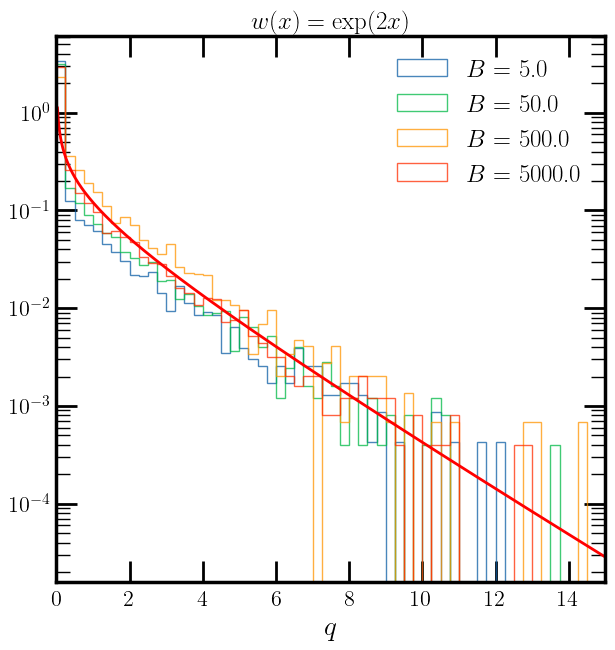

In [31]:

# =============================================================================
# 7) Plot histograms of the simulated q's vs. theoretical half–chi2
# =============================================================================
fig, ax = newplot("full")

weights = "exp"

for i, B in enumerate(B_list):
    # Shared histogram bins for all panels:
    bins = np.linspace(0, max_plot_q, 61)

    # ---- Right column: w(x)=1 (unit weights) ----
    ax.hist(q_results[B][weights] ,
            bins=bins,
            density=True,
            alpha=0.75,
            histtype = 'step',
            label=r'$B$ = ' + str(B))

    
    
    title = f"$w(x)=\exp(2x)$" if weights == "exp" else "w(x) = 1"
    if weights == "wrong":
        title = "$w(x) = \exp(2(1 + \delta)x)$"
    ax.set_title(title)
    ax.set_xlim(0, max_plot_q)
    if i == len(B_list) - 1:
        ax.set_xlabel(r"$q$")
    ax.legend()

ax.plot(q_vals,
            half_chi2_pdf,
            'r-',
            lw=2,
            label=r'$0.5\times\chi^2_{1}(q)$')

plt.yscale('log')

plt.show()

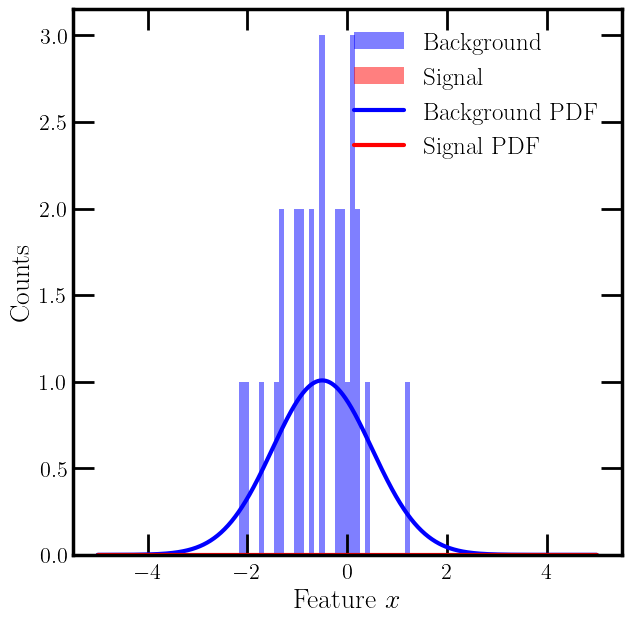

In [40]:
mu_b = -0.5
sigma_b = 1.0
mu_s = 0.5
sigma_s = 1.0

B = 25
S = 0
signal_fraction = S / (B + S)
N = np.random.poisson(B + S)

x_b = np.random.normal(mu_b, sigma_b, int(N * (1 - signal_fraction)))
x_s = np.random.normal(mu_s, sigma_s, int(N * signal_fraction))
xs = np.concatenate([x_b, x_s])
fracs_b = np.ones_like(x_b) * (1-signal_fraction)
fracs_s = np.ones_like(x_s) * (signal_fraction)

fig, ax = newplot("full")

bins = np.linspace(-5, 5, 100)
dx = bins[1] - bins[0]
ax.hist(x_b, bins=bins, alpha=0.5, label='Background', density=False, color='blue')
ax.hist(x_s, bins=bins, alpha=0.5, label='Signal', density=False, color='red')

def gaussian(x, mu, sigma):
    return (1 / (sigma * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x - mu) / sigma) ** 2)

x_vals = np.linspace(-5, 5, 1000)
ax.plot(x_vals, B * gaussian(x_vals, mu_b, sigma_b) * dx, 'b-', label='Background PDF')
ax.plot(x_vals, S * gaussian(x_vals, mu_s, sigma_s) * dx, 'r-', label='Signal PDF')

ax.set_xlabel(r'Feature $x$')
ax.set_ylabel('Counts')
plt.legend()

/tmp/ipykernel_11508/985595590.py:52: RuntimeWarning: overflow encountered in power
  dens[mask] = (1.0 / kappa) * np.exp(-lam_prime) * lam_prime**(z[mask]) / special.gamma(z[mask] + 1)
/tmp/ipykernel_11508/985595590.py:52: RuntimeWarning: invalid value encountered in true_divide
  dens[mask] = (1.0 / kappa) * np.exp(-lam_prime) * lam_prime**(z[mask]) / special.gamma(z[mask] + 1)


CPD Mean: 67.59374132900862, Variance: 9131.351914169527, Third Moment: 20198598.64225983
SPD PDF Mean: 25.000003567059217, Variance: 67.95654938220116, Third Moment: 20906.505073181735


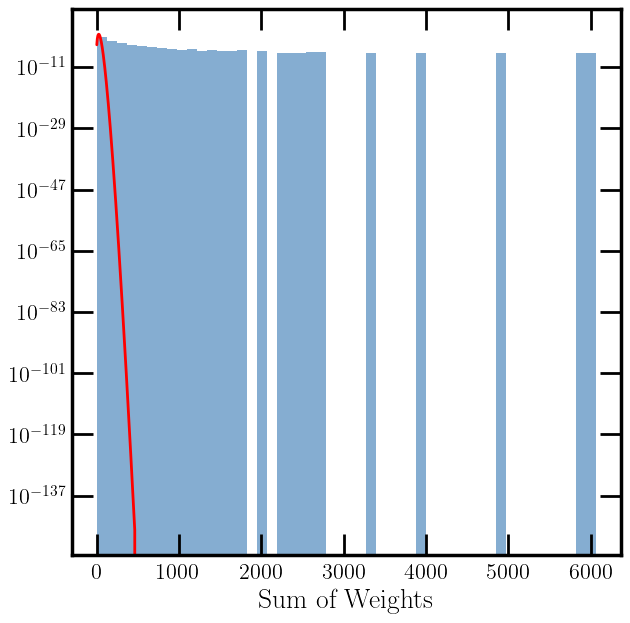

In [ ]:
num_experiments = 50000      # number of toy experiments

a = 1
xs = np.concatenate([x_b, x_s])
weights = weight_exp(a * xs)

# True kappa
mean_w = np.exp(a * mu_b + 0.5 * (a**2) * (sigma_b**2))
second_m2_w = np.exp(2 * a * mu_b + 0.5 * (2 * a)**2 * (sigma_b**2))
var_w = second_m2_w - mean_w**2
kappa = second_m2_w / mean_w


# Sample a CPD

def sample(num_samples):

    # generate num_samples Poisson-distributed events
    Ns = np.random.poisson(B, num_samples)

    max_N = np.max(Ns)
    xs = np.zeros(num_samples, max_N)



    shape = (num_samples, max_N)
    x_b = np.random.normal(mu_b, sigma_b, shape)
    weights = weight_exp(a * x_b)

    # For each sample, mask the weights to only include the first N events
    for i in range(num_samples):
        weights[i, Ns[i]:] = 0.0

    sum_weights = np.sum(weights, axis=1)

    return sum_weights



def spd_pdf(F, kappa):
    """
    Continuous SPD density approximation at values F,
    with parameters:
      lam    = Poisson rate λ
      mu1    = E[Y]
      kappa  = μ2/μ1 (scaled variance)
    """
    lam_prime = B * mean_w / kappa
    z = F / kappa
    dens = np.zeros_like(F)
    mask = (z >= 0)
    dens[mask] = (1.0 / kappa) * np.exp(-lam_prime) * lam_prime**(z[mask]) / special.gamma(z[mask] + 1)
    return dens

cpd_samples = sample(num_experiments)

fig, ax = newplot("full")
plt.hist(cpd_samples, bins=50, density=True, alpha=0.5, label='Sampled CPD')

x_vals = np.linspace(0, np.max(cpd_samples), 1000)
ax.plot(x_vals, spd_pdf(x_vals, kappa), 'r-', lw=2, label='SPD PDF')
ax.set_xlabel('Sum of Weights')

plt.yscale('log')

# Print the mean, variance, and third moment of the CPD and SPD PDF
mean_cpd = np.mean(cpd_samples)
var_cpd = np.var(cpd_samples)
third_moment_cpd = np.mean(cpd_samples**3)
mean_spd = np.nansum(spd_pdf(x_vals, kappa) * x_vals) * (x_vals[1] - x_vals[0])
var_spd = np.nansum(spd_pdf(x_vals, kappa) * (x_vals - mean_spd)**2) * (x_vals[1] - x_vals[0])
third_moment_spd = np.nansum(spd_pdf(x_vals, kappa) * (x_vals)**3) * (x_vals[1] - x_vals[0])


print(f"CPD Mean: {mean_cpd}, Variance: {var_cpd}, Third Moment: {third_moment_cpd}")
print(f"SPD PDF Mean: {mean_spd}, Variance: {var_spd}, Third Moment: {third_moment_spd}")


/tmp/ipykernel_11508/2014390669.py:131: RuntimeWarning: overflow encountered in power
  dens[mask] = (1.0 / kappa) * np.exp(-lam_prime) * lam_prime**(z[mask]) / special.gamma(z[mask] + 1)
/tmp/ipykernel_11508/2014390669.py:131: RuntimeWarning: invalid value encountered in true_divide
  dens[mask] = (1.0 / kappa) * np.exp(-lam_prime) * lam_prime**(z[mask]) / special.gamma(z[mask] + 1)


True kappa: 2.125
Biased kappa: 2.118 ± 0.109
Corrected kappa: 2.124 ± 0.108


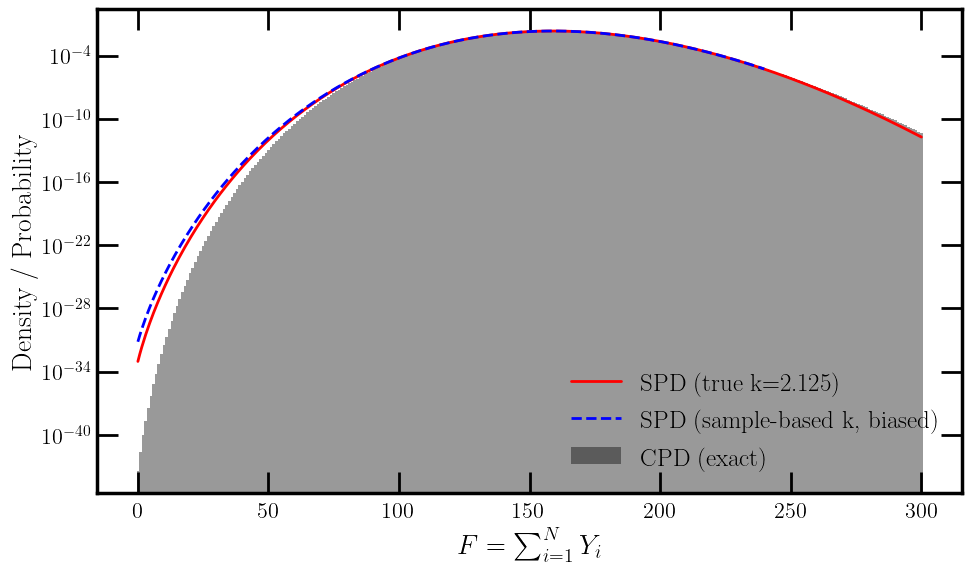

CPD mean: 160.000, variance: 340.000
CPD third moment: 880.000
SPD (true kappa) mean: 160.000, variance: 340.000
SPD (true kappa) third moment: 722.500
SPD (biased kappa) mean: nan, variance: 0.000
SPD (biased kappa) third moment: 0.000


/tmp/ipykernel_11508/2014390669.py:220: RuntimeWarning: invalid value encountered in double_scalars
  mean_spd_biased = np.nansum(F_vals * spd_biased) / np.nansum(spd_biased)


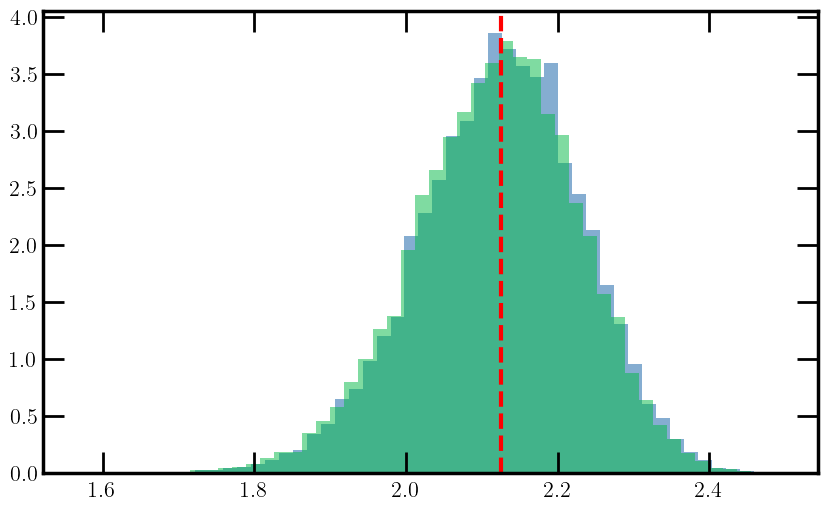

In [31]:
import numpy as np
import scipy.stats as stats
import scipy.special as special
import matplotlib.pyplot as plt







# =============================================================================
# 1) Define the “true” weight distribution Y:
#    Y = 1 with p=0.7, Y = 3 with p=0.3
# =============================================================================
weights = np.array([1, 3])
probs   = np.array([0.7, 0.3])

# Compute true moments under the background pdf p(x) ↦ g(y)
mu1 = np.sum(probs * weights)        # E[Y]
mu2 = np.sum(probs * weights**2)     # E[Y^2]
mu3 = np.sum(probs * weights**3)     # E[Y^3]
kappa_true = mu2 / mu1               # exact κ

# =============================================================================
# 2) Simulation parameters
# =============================================================================
lam             = 100.0       # Poisson rate
num_experiments = 50000      # number of toy experiments
F_max           = 300         # truncate F at 0..80
nmax            = 1000         # max N for CPD sum (should be >> λ)

# Arrays to accumulate (F_obs, kappa_hat, kappa_corr) for each experiment
F_obs_list     = []
kappa_hat_list = []
kappa_corr_list = []

# =============================================================================
# 3) Run toy experiments under H0 (pure Poisson + weight draws)
#    - Draw N ~ Pois(lam)
#    - If N>0, draw Y_i ∈ {1,3} with p=0.7,0.3. Else skip (N=0 almost never for λ=10)
#    - Compute F_obs = sum_i Y_i
#    - Compute empirical μ1_hat, μ2_hat, μ3_hat from that same Y-sample
#    - Compute kappa_hat = μ2_hat / μ1_hat
#    - Compute bias_est = (μ2_hat^2 - μ1_hat*μ3_hat)/(N * μ1_hat^3)
#    - Compute kappa_corr = kappa_hat - bias_est
# =============================================================================
for _ in range(num_experiments):
    N = np.random.poisson(lam)
    if N == 0:
        continue  # skip the rare N=0 case
    # Draw N i.i.d. weights Y_i
    Y = np.random.choice(weights, size=N, p=probs)

    # Total observed F
    F_obs = np.sum(Y)

    # Empirical raw moments from the same sample
    mu1_hat = np.mean(Y)
    mu2_hat = np.mean(Y**2)
    mu3_hat = np.mean(Y**3)

    # Biased kappa
    kappa_hat = mu2_hat / mu1_hat

    # Delta-method bias estimate
    bias_est = (mu2_hat**2 - mu1_hat * mu3_hat) / (N * mu1_hat**3)

    # Bias-corrected kappa
    kappa_corr = kappa_hat - bias_est

    # Store
    F_obs_list.append(F_obs)
    kappa_hat_list.append(kappa_hat)
    kappa_corr_list.append(kappa_corr)

# Convert to numpy arrays
F_obs_arr      = np.array(F_obs_list)
kappa_hat_arr  = np.array(kappa_hat_list)
kappa_corr_arr = np.array(kappa_corr_list)

# =============================================================================
# 4) Build the exact CPD pmf p_CPD(F; λ) for F=0..F_max by summing over n=0..nmax
# =============================================================================
cpd_pmf = np.zeros(F_max+1)

# Poisson PMF for N=0..nmax
poisson_pmf = stats.poisson.pmf(np.arange(nmax+1), lam)

# Single-step pmf of Y (discrete at 1 and 3)
pmf_y = np.zeros(F_max+1)
pmf_y[1] = probs[0]  # P(Y=1)
pmf_y[3] = probs[1]  # P(Y=3)

# We will keep convolving to get the distribution of sum_{i=1}^n Y_i
pmf_prev = np.zeros(F_max+1)
pmf_prev[0] = 1.0  # for n=0, sum=0 with prob=1

for n in range(nmax+1):
    if n == 0:
        pmf_sum_n = pmf_prev.copy()
    else:
        # Convolve the previous (n-1)-sum with one more Y-step
        pmf_sum_n = np.convolve(pmf_prev, pmf_y)[: F_max+1]
    # Weight by P(N=n) and accumulate
    cpd_pmf += poisson_pmf[n] * pmf_sum_n
    # Prepare for next n
    pmf_prev = pmf_sum_n.copy()

# Renormalize just in case of tiny truncation error
cpd_pmf /= np.sum(cpd_pmf)

# =============================================================================
# 5) Define SPD density function for general continuous F
#    SPD:   Z ~ Pois(λ')   then   F_spd = κ * Z
#    with λ' = λ * μ1 / κ.  So z = F/κ, and
#      p_SPD(F) = (1/κ) e^{-λ'} λ'^{z} / Γ(z+1),  for z>=0
# =============================================================================
def spd_density(F, lam, mu1, kappa):
    """
    Continuous SPD density approximation at values F,
    with parameters:
      lam    = Poisson rate λ
      mu1    = E[Y]
      kappa  = μ2/μ1 (scaled variance)
    """
    lam_prime = lam * mu1 / kappa
    z = F / kappa
    dens = np.zeros_like(F)
    mask = (z >= 0)
    dens[mask] = (1.0 / kappa) * np.exp(-lam_prime) * lam_prime**(z[mask]) / special.gamma(z[mask] + 1)
    return dens

# 6) Evaluate SPD “true” once on a grid of F
F_vals = np.linspace(0, F_max, 400)
spd_true = spd_density(F_vals, lam, mu1, kappa_true)

# 7) Build “SPD with sample-based kappa” by averaging over experiments
spd_biased = np.zeros_like(F_vals)
for k in kappa_hat_arr:
    spd_biased += spd_density(F_vals, lam, mu1, k)
spd_biased /= len(kappa_hat_arr)

# 8) Build “SPD with corrected kappa” by averaging over corrected kappas
spd_corrected = np.zeros_like(F_vals)
for k in kappa_corr_arr:
    spd_corrected += spd_density(F_vals, lam, mu1, k)
spd_corrected /= len(kappa_corr_arr)

# =============================================================================
# 9) Plot everything together
# =============================================================================
plt.figure(figsize=(10, 6))

print(f"True kappa: {kappa_true:.3f}")
print(f"Biased kappa: {np.mean(kappa_hat_arr):.3f} ± {np.std(kappa_hat_arr):.3f}")
print(f"Corrected kappa: {np.mean(kappa_corr_arr):.3f} ± {np.std(kappa_corr_arr):.3f}")

# (a) Exact CPD as a bar histogram (discrete at integers)
plt.bar(
    np.arange(F_max+1), 
    cpd_pmf, 
    width=1.0, 
    alpha=0.4, 
    color='black', 
    label='CPD (exact)'
)

# (b) SPD with true κ
plt.plot(
    F_vals, 
    spd_true, 
    'r-', 
    lw=2, 
    label=f'SPD (true k={kappa_true:.3f})'
)

# (c) SPD with sample-based “biased” κ
plt.plot(
    F_vals, 
    spd_biased, 
    'b--', 
    lw=2, 
    label='SPD (sample-based k, biased)'
)

# # (d) SPD with sample-based “corrected” κ
# plt.plot(
#     F_vals, 
#     spd_corrected, 
#     'b:', 
#     lw=2, 
#     label='SPD (sample-based k, bias-corrected)'
# )

# plt.xlim(0, 60)
plt.yscale('log')
plt.xlabel(r'$F = \sum_{i=1}^{N} Y_i$')
plt.ylabel('Density / Probability')
# plt.title(r'CPD vs SPD: true $\kappa$ vs. sample‐wide $\hat\kappa$ (biased & corrected)')
plt.legend()
plt.tight_layout()
plt.show()

# Mean and variance of CPD:
mean_cpd = np.sum(np.arange(F_max + 1) * cpd_pmf)
var_cpd = np.sum((np.arange(F_max + 1) - mean_cpd)**2 * cpd_pmf)
third_moment_cpd = np.sum((np.arange(F_max + 1) - mean_cpd)**3 * cpd_pmf)
print(f"CPD mean: {mean_cpd:.3f}, variance: {var_cpd:.3f}")
print(f"CPD third moment: {third_moment_cpd:.3f}")

# Mean and variance of SPD with true kappa:
mean_spd_true = np.sum(F_vals * spd_true) / np.sum(spd_true)
var_spd_true = np.sum((F_vals - mean_spd_true)**2 * spd_true) / np.sum(spd_true)
third_moment_true = np.sum((F_vals - mean_spd_true)**3 * spd_true) / np.sum(spd_true)
print(f"SPD (true kappa) mean: {mean_spd_true:.3f}, variance: {var_spd_true:.3f}")
print(f"SPD (true kappa) third moment: {third_moment_true:.3f}")

# Mean and variance of SPD with biased kappa:
mean_spd_biased = np.nansum(F_vals * spd_biased) / np.nansum(spd_biased)
var_spd_biased = np.nansum((F_vals - mean_spd_biased)**2 * spd_biased) / np.nansum(spd_biased)
third_moment_biased = np.nansum((F_vals - mean_spd_biased)**3 * spd_biased) / np.nansum(spd_biased)
print(f"SPD (biased kappa) mean: {mean_spd_biased:.3f}, variance: {var_spd_biased:.3f}")
print(f"SPD (biased kappa) third moment: {third_moment_biased:.3f}")


# =============================================================================
fig, ax = plt.subplots(figsize=(10, 6))

plt.hist(kappa_corr_list, bins=50, density=True, alpha=0.5, label='kappa_corr')
plt.hist(kappa_hat_list, bins=50, density=True, alpha=0.5, label='kappa_hat')
plt.axvline(kappa_true, color='red', linestyle='--', label='True kappa')


Mean of w(x) = 1.0000, Variance of w(x) = 53.5982, kappa = 54.5982


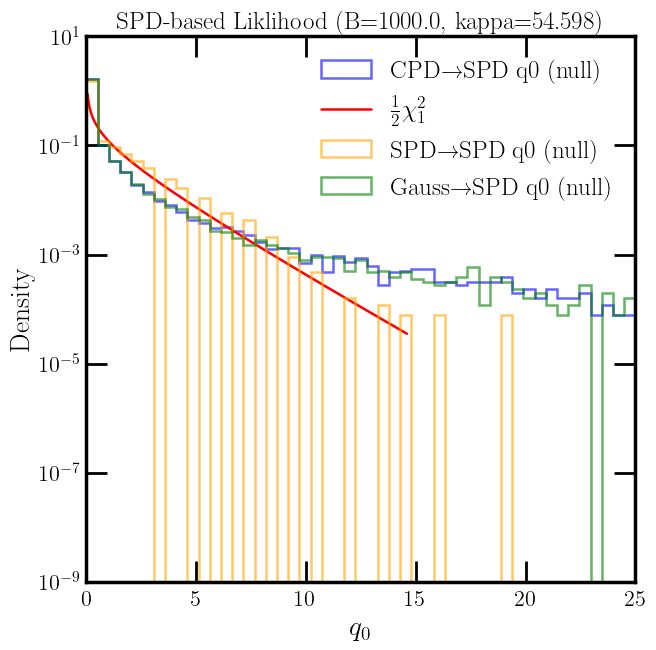

Mean CPD‐based q0  = 0.5262
Mean SPD‐based q0  = 0.4755


In [36]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, chi2
from rikabplotlib.plot_utils import newplot

# ----------------- USER PARAMETERS ---------------------
B = 1000.0             # mean number of background events under H0
mu_b = -1.0            # background Gaussian mean
sigma = 1.0            # background Gaussian sigma
n_toys = 50000         # number of toy experiments
# -------------------------------------------------------

# 1) Compute exact per-event weight moments under X ~ N(mu_b, sigma^2):
#    w(x) = exp(2x)  =>  E[w] = exp(2 mu_b + 0.5*(2^2)*sigma^2)
#                    =>  E[w^2] = exp(4 mu_b + 0.5*(4^2)*sigma^2)


def moments():

    a = 2.0
    # w(x) = exp(ax) 
    mean_w = np.exp(a * mu_b + 0.5 * (a**2) * (sigma**2))
    second_m2_w = np.exp(2 * a * mu_b + 0.5 * (2 * a)**2 * (sigma**2))
    var_w = second_m2_w - mean_w**2
    kappa = second_m2_w / mean_w

    return mean_w, second_m2_w, var_w, kappa


mean_w, second_m2_w, var_w, kappa = moments()

print(f"Mean of w(x) = {mean_w:.4f}, Variance of w(x) = {var_w:.4f}, "
      f"kappa = {kappa:.4f}")

# SPD Poisson parameter: λ_SPD = B * (μ₁^2 / μ₂)
lam_spd = B * mean_w**2 / second_m2_w

# 2) Discovery-statistic q0 using the SPD formula (no need to re-derive):
#    q0(W) = 0 if W <= B·μ₁, else (2/κ)[W·ln(W/(B·μ₁)) – (W – B·μ₁)].
def q0_spd_from_W(W):



    # ws = np.exp(2.1 * xs)
    # mean_w = np.mean(ws)
    # second_m2_w = np.mean(ws**2)
    # var_w = second_m2_w - mean_w**2
    # kappa = second_m2_w / mean_w

    # lam_spd = B * mean_w**2 / second_m2_w


    B_W = B * mean_w
    if W <= B_W:
        return 0.0
    return (2.0 / kappa) * (W * np.log(W / B_W) - (W - B_W))

# 3) Simulate "CPD‐based" toys under H0:
#    - Draw N ~ Pois(B).
#    - If N>0, draw x_i ~ N(mu_b, sigma^2), compute w_i = exp(2·x_i), sum W = Σ w_i.
#    - Plug W into q0_spd_from_W to get the “exact CPD‐based q0” approximation.
rng = np.random.default_rng(1234)
q0_vals_cpd = np.zeros(n_toys)
for i in range(n_toys):
    N = rng.poisson(B)
    if N == 0:
        W = 0.0
    else:
        X = rng.normal(loc=mu_b, scale=sigma, size=N)
        W = np.sum(np.exp(2 * X))
    q0_vals_cpd[i] = q0_spd_from_W(W)

# 4) Simulate "SPD-based" toys under H0:
#    - Draw Y ~ Pois(λ_SPD).
#    - Let W_spd = κ·Y.
#    - Compute q0_spd_from_W(W_spd).
q0_vals_spd = np.zeros(n_toys)
for i in range(n_toys):
    Y = rng.poisson(lam_spd)
    W_spd = kappa * Y
    q0_vals_spd[i] = q0_spd_from_W(W_spd)


q0_vals_gaussian = np.zeros(n_toys)
for i in range(n_toys):
    N = rng.poisson(B)
    if N == 0:
        W = 0.0
    else:
        X = rng.normal(loc=mu_b, scale=sigma, size=N)
        W = np.sum(np.exp(2 * X))
    q0_vals_gaussian[i] = q0_spd_from_W(W)

# 5) Overlay histograms vs. the ½ χ²₁ limit:
x_max = max(np.percentile(q0_vals_cpd, 99.5),
            np.percentile(q0_vals_spd, 99.5))
x_vals = np.linspace(0, x_max, 300)
chi_pdf = 0.5 * chi2(df=1).pdf(x_vals)

fig, ax = newplot("full")

plt.hist(q0_vals_cpd / np.mean(2 * q0_vals_cpd), bins=np.linspace(0,25,50), density=True, alpha=0.6,
         label="CPD→SPD q0 (null)", histtype='step', color = 'blue', lw=1.8)
plt.plot(x_vals, chi_pdf, 'r-', lw=1.8, label=r"$\frac{1}{2}\chi^2_{1}$")
plt.xlabel(r"$q_0$")
plt.ylabel("Density")
plt.title(f"CPD‐based null distribution (B={B}, w=exp2x)")
plt.yscale('log')
plt.xlim(0, 25)

plt.hist(q0_vals_spd, bins=np.linspace(0,25,50), density=True, alpha=0.6,
         label="SPD→SPD q0 (null)", histtype='step', color = 'orange', lw=1.8)

plt.hist(q0_vals_gaussian / np.mean(2 * q0_vals_gaussian), bins=np.linspace(0,25,50), density=True, alpha=0.6,
         label="Gauss→SPD q0 (null)", histtype='step', color = 'green', lw=1.8)


plt.xlabel(r"$q_0$")
plt.ylabel("Density")
plt.yscale('log')
plt.xlim(0, 25)
plt.title(f"SPD‐based Liklihood (B={B}, kappa={kappa:.3f})")
plt.legend()

plt.ylim(1e-9, 1e1)

plt.show()

# 6) Print the means to gauge the scale‐factor mismatch:
print(f"Mean CPD‐based q0  = {q0_vals_cpd.mean():.4f}")
print(f"Mean SPD‐based q0  = {q0_vals_spd.mean():.4f}")


In [ ]:
B = 1000.0             # mean number of background events under H0
mu_b = -1.0            # background Gaussian mean
sigma = 1.0            # background Gaussian sigma
n_toys = 50000         # number of toy experiments
# -------------------------------------------------------

# 1) Compute exact per-event weight moments under X ~ N(mu_b, sigma^2):
#    w(x) = exp(2x)  =>  E[w] = exp(2 mu_b + 0.5*(2^2)*sigma^2)
#                    =>  E[w^2] = exp(4 mu_b + 0.5*(4^2)*sigma^2)

a = 2.0
def moments():

    # w(x) = exp(ax) 
    mean_w = np.exp(a * mu_b + 0.5 * (a**2) * (sigma**2))
    second_m2_w = np.exp(2 * a * mu_b + 0.5 * (2 * a)**2 * (sigma**2))
    var_w = second_m2_w - mean_w**2
    kappa = second_m2_w / mean_w

    return mean_w, second_m2_w, var_w, kappa


mean_w, second_m2_w, var_w, kappa = moments()

Bs = np.logspace(0, 4, 10, dtype=int)  # Background rates to test

fig, ax = newplot("full")

n_tpoys = 50000  # number of toy experiments
means = []
sts = []
means_unbiased = []
sts_unbiased = []

for B in Bs:
    lam_spd = B * mean_w**2 / second_m2_w
    print(f"B={B}, λ_SPD={lam_spd:.4f}, kappa={kappa:.4f}")

    rng = np.random.default_rng()
    q0_vals_cpd = np.zeros(n_toys)
    kappa_hat = np.zeros(n_toys)
    kappa_hat_unbiased = np.zeros(n_toys)
    for i in range(n_toys):
        N = rng.poisson(B)
        if N == 0:
            W = 0.0
        else:
            X = rng.normal(loc=mu_b, scale=sigma, size=B)
            W = np.sum(np.exp(a * X))
            ws = np.exp(a * X)
            w1 = np.mean(ws)
            w2 = np.mean(ws**2)
            kappa_hat[i] = w2 / w1


            w3 = np.mean(ws**3)
            bias_est = (w2**2 - w1 * w3) / (B * w1**3)
            kappa_hat_unbiased[i] = w2/w1 - bias_est

    means.append(np.mean(kappa_hat))
    sts.append(np.std(kappa_hat) / np.sqrt(B))
    means_unbiased.append(np.mean(kappa_hat_unbiased))
    sts_unbiased.append(np.std(kappa_hat_unbiased) / np.sqrt(B))

plt.errorbar(Bs, means, yerr=sts, fmt='o-', label='Sample $\kappa$', color='blue', lw=2)
plt.errorbar(Bs, means_unbiased, yerr=sts_unbiased, fmt='o--', label='Corrected $\kappa$', color='green', lw=2)
plt.axhline(kappa, color='red', linestyle='--', label='True $\kappa$', lw=2)
plt.xscale('log')
plt.xlabel('Background B')
plt.ylabel('$\kappa$')
plt.title('Sample $\kappa$ vs. True $\kappa$')
plt.legend()


NameError: name 'np' is not defined

B=1, λ_SPD=0.368, true κ=1.649
B=2, λ_SPD=0.736, true κ=1.649


/tmp/ipykernel_28979/1487980336.py:66: RuntimeWarning: Mean of empty slice.
  w1_lo = w_lo.mean()
/home/rikab/miniconda3/envs/SHAPER/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_28979/1487980336.py:67: RuntimeWarning: Mean of empty slice.
  w2_lo = (w_lo**2).mean()


B=7, λ_SPD=2.575, true κ=1.649
B=21, λ_SPD=7.725, true κ=1.649
B=59, λ_SPD=21.705, true κ=1.649
B=166, λ_SPD=61.068, true κ=1.649
B=464, λ_SPD=170.696, true κ=1.649
B=1291, λ_SPD=474.932, true κ=1.649
B=3593, λ_SPD=1321.791, true κ=1.649
B=10000, λ_SPD=3678.794, true κ=1.649


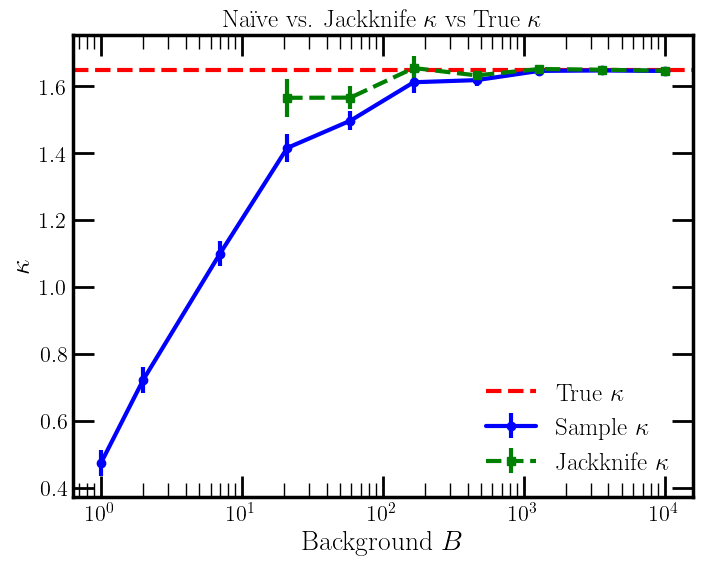

In [67]:
import numpy as np
import matplotlib.pyplot as plt

# -------------- PARAMETERS ------------------
a        = 1.0    # exponent in w(x)=exp(a*x)
mu_b     = -1.0   # background Gaussian mean
sigma    = 1.0    # background Gaussian sigma
n_toys   = 500  # number of Monte Carlo toys per B
# --------------------------------------------

# 1) Compute exact per-event weight moments under X ~ N(mu_b, σ^2):
#    w(x)=exp(a x).
def moments():
    mean_w      = np.exp(a*mu_b + 0.5*(a**2)*(sigma**2))
    second_m2_w = np.exp(2*a*mu_b + 0.5*(2*a)**2*(sigma**2))
    var_w       = second_m2_w - mean_w**2
    kappa       = second_m2_w / mean_w
    return mean_w, second_m2_w, var_w, kappa

mean_w, second_m2_w, var_w, kappa_true = moments()

Bs = np.logspace(0, 4, 10, dtype=int)  # background rates to test

fig, ax = plt.subplots(figsize=(8,6))
means      = []
sts        = []
means_jk   = []
sts_jk     = []

for B in Bs:
    # SPD parameters (unused here, but kept for reference)
    lam_spd = B * mean_w**2 / second_m2_w
    print(f"B={B}, λ_SPD={lam_spd:.3f}, true κ={kappa_true:.3f}")

    rng = np.random.default_rng()
    # Arrays to store each toy's estimates
    kappa_naive = np.zeros(n_toys)
    kappa_jk    = np.zeros(n_toys)

    for i in range(n_toys):
        # 2) Draw N ~ Poisson(B)
        N = rng.poisson(B)
        if N == 0:
            # If no events, both estimators = 0 (or you could set to np.nan)
            kappa_naive[i] = 0.0
            kappa_jk[i]    = 0.0
            continue

        # 3) Draw N background x_i ~ N(mu_b,σ), compute w_i = exp(a x_i)
        X = rng.normal(loc=mu_b, scale=sigma, size=N)
        ws = np.exp(a * X)

        # 4) Naïve (biased) estimator: w1 = mean(ws), w2 = mean(ws**2)
        w1 = ws.mean()
        w2 = (ws**2).mean()
        kappa_naive[i] = w2 / w1

        # 5) Jackknife: leave-one-out for each w[j]
        #    We need the N “leave-one-out” κ_{(-j)} values.
        #    We can speed this up by summing once and subtracting each w[j],
        #    but here we do it straightforwardly for clarity.
        kappas_loo = np.zeros(N)
        for j in range(N):
            # Form the (N-1)-sized array leaving out w[j]:
            w_lo = np.delete(ws, j)        # length (N-1)
            w1_lo = w_lo.mean()
            w2_lo = (w_lo**2).mean()
            kappas_loo[j] = w2_lo / w1_lo

        # 6) Jackknife estimator: N*kappa_full - (N-1)*mean(kappa_loo)
        kappa_jk[i] = N * kappa_naive[i] - (N - 1) * kappas_loo.mean()

    # 7) Compute means and standard errors over the toys
    means.append(np.mean(kappa_naive))
    sts.append(np.std(kappa_naive)/np.sqrt(n_toys))

    means_jk.append(np.mean(kappa_jk))
    sts_jk.append(np.std(kappa_jk)/np.sqrt(n_toys))

# 8) Plot results
ax.errorbar(Bs, means,       yerr=sts,    fmt='o-',  color='blue', label='Sample $\\kappa$')
ax.errorbar(Bs, means_jk,    yerr=sts_jk, fmt='s--', color='green', label='Jackknife $\\kappa$')
ax.axhline(kappa_true, color='red', linestyle='--', label='True $\\kappa$')
ax.set_xscale('log')
ax.set_xlabel('Background $B$')
ax.set_ylabel('$\\kappa$')
ax.set_title('Naïve vs. Jackknife $\kappa$ vs True $\kappa$')
ax.legend()
plt.show()


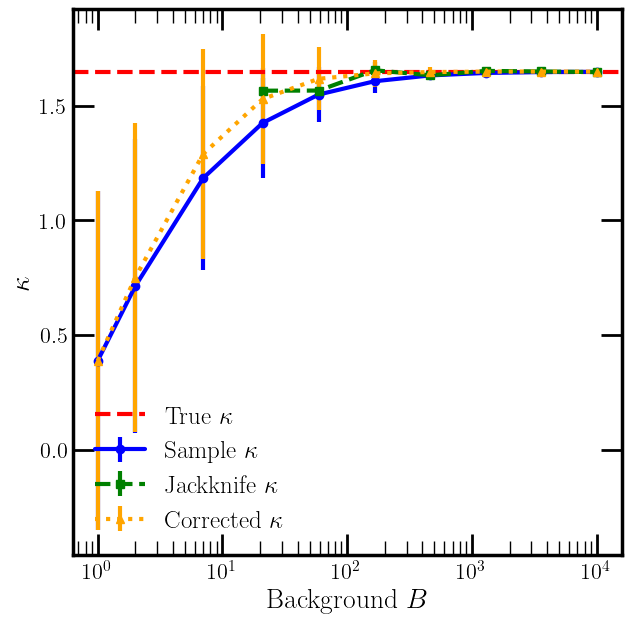

In [73]:
fig, ax = newplot("full")

# 8) Plot results
ax.errorbar(Bs, means,       yerr=sts,    fmt='o-',  color='blue', label='Sample $\\kappa$')
ax.errorbar(Bs, means_jk,    yerr=sts_jk, fmt='s--', color='green', label='Jackknife $\\kappa$')
ax.errorbar(Bs, means_unbiased, yerr=sts_unbiased, fmt='^:', color='orange', label='Corrected $\\kappa$')
ax.axhline(kappa_true, color='red', linestyle='--', label='True $\\kappa$')
ax.set_xscale('log')
ax.set_xlabel('Background $B$')
ax.set_ylabel('$\\kappa$')
ax.legend()
plt.show()

mean_w=1.0000, second_m2_w=1.0000, kappa=1.0000
mean_w=0.6096, second_m2_w=0.8353, kappa=1.3703
mean_w=0.6065, second_m2_w=1.0000, kappa=1.6487
mean_w=0.6096, second_m2_w=1.2461, kappa=2.0442
mean_w=1.0000, second_m2_w=1.0000, kappa=1.0000
mean_w=0.6096, second_m2_w=0.8353, kappa=1.3703
mean_w=0.6065, second_m2_w=1.0000, kappa=1.6487
mean_w=0.6096, second_m2_w=1.2461, kappa=2.0442
mean_w=1.0000, second_m2_w=1.0000, kappa=1.0000
mean_w=0.6096, second_m2_w=0.8353, kappa=1.3703
mean_w=0.6065, second_m2_w=1.0000, kappa=1.6487
mean_w=0.6096, second_m2_w=1.2461, kappa=2.0442
mean_w=1.0000, second_m2_w=1.0000, kappa=1.0000
mean_w=0.6096, second_m2_w=0.8353, kappa=1.3703
mean_w=0.6065, second_m2_w=1.0000, kappa=1.6487
mean_w=0.6096, second_m2_w=1.2461, kappa=2.0442
mean_w=1.0000, second_m2_w=1.0000, kappa=1.0000
mean_w=0.6096, second_m2_w=0.8353, kappa=1.3703
mean_w=0.6065, second_m2_w=1.0000, kappa=1.6487
mean_w=0.6096, second_m2_w=1.2461, kappa=2.0442
mean_w=1.0000, second_m2_w=1.0000, kappa

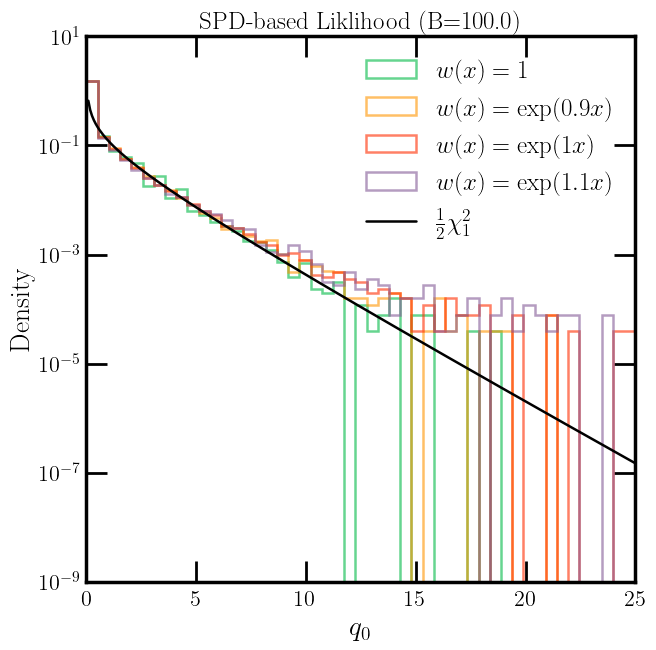

Mean CPD‐based q0  = 0.4894
Mean SPD‐based q0  = 0.5054


In [22]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, chi2
from rikabplotlib.plot_utils import newplot

# ----------------- USER PARAMETERS ---------------------
B = 100.0             # mean number of background events under H0
mu_b = -1.0            # background Gaussian mean
sigma = 1.0            # background Gaussian sigma
n_toys = 50000         # number of toy experiments
# -------------------------------------------------------

# 1) Compute exact per-event weight moments under X ~ N(mu_b, sigma^2):
#    w(x) = exp(2x)  =>  E[w] = exp(2 mu_b + 0.5*(2^2)*sigma^2)
#                    =>  E[w^2] = exp(4 mu_b + 0.5*(4^2)*sigma^2)


def moments(a):

    # w(x) = exp(ax) 
    mean_w = np.exp(a * mu_b + 0.5 * (a**2) * (sigma**2))
    second_m2_w = np.exp(2 * a * mu_b + 0.5 * (2 * a)**2 * (sigma**2))
    var_w = second_m2_w - mean_w**2
    kappa = second_m2_w / mean_w

    return mean_w, second_m2_w, var_w, kappa




# SPD Poisson parameter: λ_SPD = B * (μ₁^2 / μ₂)

# 2) Discovery-statistic q0 using the SPD formula (no need to re-derive):
#    q0(W) = 0 if W <= B·μ₁, else (2/κ)[W·ln(W/(B·μ₁)) – (W – B·μ₁)].
def q0_spd_from_W(X, a):

    W = np.sum(np.exp(a * X))
    mean_w, second_m2_w, var_w, kappa = moments(a)
    print(f"mean_w={mean_w:.4f}, second_m2_w={second_m2_w:.4f}, kappa={kappa:.4f}")
    lam_spd = B * mean_w**2 / second_m2_w

    B_W = B * mean_w
    if W <= B_W:
        return 0.0
    return (2.0 / kappa) * (W * np.log(W / B_W) - (W - B_W))

# 3) Simulate "CPD‐based" toys under H0:
#    - Draw N ~ Pois(B).
#    - If N>0, draw x_i ~ N(mu_b, sigma^2), compute w_i = exp(2·x_i), sum W = Σ w_i.
#    - Plug W into q0_spd_from_W to get the “exact CPD‐based q0” approximation.
rng = np.random.default_rng(1234)
q0_vals_cpd_0 = np.zeros(n_toys)
q0_vals_cpd_1_9 = np.zeros(n_toys)
q0_vals_cpd_2_0 = np.zeros(n_toys)
q0_vals_cpd_2_1 = np.zeros(n_toys)
for i in range(n_toys):
    N = rng.poisson(B)
    if N == 0:
        W = 0.0
    else:
        X = rng.normal(loc=mu_b, scale=sigma, size=N)
    q0_vals_cpd_0[i] = q0_spd_from_W(X, 0)
    q0_vals_cpd_1_9[i] = q0_spd_from_W(X, 0.9)
    q0_vals_cpd_2_0[i] = q0_spd_from_W(X, 1.0)
    q0_vals_cpd_2_1[i] = q0_spd_from_W(X, 1.1)

# # 4) Simulate "SPD-based" toys under H0:
# #    - Draw Y ~ Pois(λ_SPD).
# #    - Let W_spd = κ·Y.
# #    - Compute q0_spd_from_W(W_spd).
# q0_vals_spd = np.zeros(n_toys)
# for i in range(n_toys):
#     Y = rng.poisson(lam_spd)
#     W_spd = kappa * Y
#     q0_vals_spd[i] = q0_spd_from_W(W_spd)


# q0_vals_gaussian = np.zeros(n_toys)
# for i in range(n_toys):
#     N = rng.poisson(B)
#     if N == 0:
#         W = 0.0
#     else:
#         X = rng.normal(loc=mu_b, scale=sigma, size=N)
#         W = np.sum(np.exp(2 * X))
#     q0_vals_gaussian[i] = q0_spd_from_W(W)

# 5) Overlay histograms vs. the ½ χ²₁ limit:
x_max = max(np.percentile(q0_vals_cpd_0, 99.5),
            np.percentile(q0_vals_cpd_2_1, 99.5))
x_vals = np.linspace(0, 25, 300)
chi_pdf = 0.5 * chi2(df=1).pdf(x_vals)

fig, ax = newplot("full")

plt.hist(q0_vals_cpd_0 , bins=np.linspace(0,25,50), density=True, alpha=0.6,
         label=r"$w(x) = 1$", histtype='step', color = 'C1', lw=1.8)
plt.hist(q0_vals_cpd_1_9, bins=np.linspace(0,25,50), density=True, alpha=0.6,
         label=r"$w(x) = \exp(0.9x)$", histtype='step', color = 'C2', lw=1.8)
plt.hist(q0_vals_cpd_2_0, bins=np.linspace(0,25,50), density=True, alpha=0.6,
         label=r"$w(x) = \exp(1x)$", histtype='step', color = 'C3', lw=1.8)
plt.hist(q0_vals_cpd_2_1, bins=np.linspace(0,25,50), density=True, alpha=0.6,
         label=r"$w(x) = \exp(1.1x)$", histtype='step', color = 'C4', lw=1.8)


plt.plot(x_vals, chi_pdf, 'black', lw=1.8, label=r"$\frac{1}{2}\chi^2_{1}$")
plt.xlabel(r"$q_0$")
plt.ylabel("Density")
plt.title(f"CPD‐based null distribution (B={B}, w=exp2x)")
plt.yscale('log')
plt.xlim(0, 25)




plt.xlabel(r"$q_0$")
plt.ylabel("Density")
plt.yscale('log')
plt.xlim(0, 25)
plt.title(f"SPD‐based Liklihood (B={B})")
plt.legend()

plt.ylim(1e-9, 1e1)

plt.show()

# 6) Print the means to gauge the scale‐factor mismatch:
print(f"Mean CPD‐based q0  = {q0_vals_cpd_0.mean():.4f}")
print(f"Mean SPD‐based q0  = {q0_vals_cpd_2_0.mean():.4f}")
